In [9]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from pyproj import Proj, Transformer
%matplotlib inline


In [3]:
file_path = "data/Crime_Data_from_2020_to_Present_20241013.csv"

df = pd.read_csv(file_path)

df = df.dropna(subset=['LAT', 'LON'])
df = df.drop_duplicates()

In [5]:
df.head()
df.shape

(982638, 28)

In [6]:
transformer = Transformer.from_crs("epsg:4326", "epsg:32611")
df['UTM_East'], df['UTM_North'] = transformer.transform(df['LAT'].values, df['LON'].values)



In [7]:
from pyspark.sql import SparkSession
from pyspark.ml.clustering import KMeans
from pyspark.ml.feature import VectorAssembler

# Start a Spark session
spark = SparkSession.builder.appName("CrimeHotspotDetection").getOrCreate()

# Convert Pandas DataFrame to Spark DataFrame
crime_spark_df = spark.createDataFrame(df)

# Combine UTM coordinates into a feature vector
assembler = VectorAssembler(inputCols=["UTM_East", "UTM_North"], outputCol="features")
crime_spark_df = assembler.transform(crime_spark_df)

# KMeans clustering with 20 clusters (or any number based on experimentation)
kmeans = KMeans(k=20, seed=1)  # Adjust k as needed
model = kmeans.fit(crime_spark_df)

# Make predictions and retrieve cluster centers
predictions = model.transform(crime_spark_df)
centers = model.clusterCenters()

# Show the results (this will show the clusters)
predictions.select("Latitude", "Longitude", "prediction").show()

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/10/16 14:31:32 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
24/10/16 14:31:43 WARN GarbageCollectionMetrics: To enable non-built-in garbage collector(s) List(G1 Concurrent GC), users should configure it(them) to spark.eventLog.gcMetrics.youngGenerationGarbageCollectors or spark.eventLog.gcMetrics.oldGenerationGarbageCollectors
24/10/16 14:32:26 WARN SparkStringUtils: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.
24/10/16 14:32:26 WARN TaskSetManager: Stage 0 contains a task of very large size (18417 KiB). The maximum recommended task size is 1000 KiB.
24/10/16 14:32:33 WARN TaskSetManager: Stage 3 contains a task of very large size (18417 KiB). The maximum recommended task siz

ConnectionRefusedError: [Errno 61] Connection refused

In [21]:
from sklearn.cluster import DBSCAN
import numpy as np

# Example: subset of data for testing
coords = df[['UTM_East', 'UTM_North']].values

# DBSCAN parameters
db = DBSCAN(eps=500, min_samples=1000).fit(coords)  # Adjust `eps` based on UTM units (500 meters here)
labels = db.labels_

# Add labels back to the dataframe
df['Cluster'] = labels

# Find hot spot clusters (non-noise clusters, where label != -1)
hot_spots = df[df['Cluster'] != -1]

In [22]:
hot_spots["Cluster"].unique()

array([ 0,  1,  2, 18,  3,  4,  9, 13, 23,  5,  6, 38, 17,  7, 40,  8, 12,
       35, 16, 10, 11, 43, 14, 39, 15, 28, 36, 34, 27, 22, 19, 26, 24, 37,
       20, 21, 30, 29, 46, 25, 32, 42, 31, 45, 33, 41, 44])

In [23]:
import folium
from folium.plugins import HeatMap

# Prepare heatmap data from the detected hot spot locations (subset example)
heatmap_data = list(zip(hot_spots['LAT'], hot_spots['LON']))

# Create a folium map centered at an average location
m = folium.Map(location=[df['LAT'].mean(), df['LON'].mean()], zoom_start=12)

# Add the heatmap layer
HeatMap(heatmap_data, radius=15, blur=10).add_to(m)

# Show the map (or save to file)
m.save("crime_hotspots.html")
m

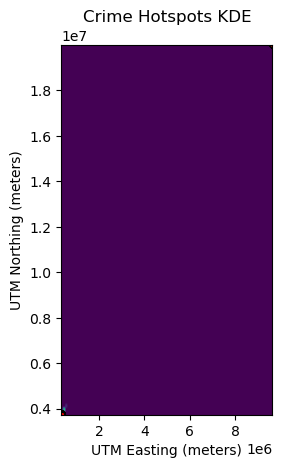

In [15]:
import numpy as np
from scipy.stats import gaussian_kde
import matplotlib.pyplot as plt

# Subset data for example
subset = df.sample(10000)  # You can adjust sample size

# Apply KDE on UTM coordinates
coords = np.vstack([subset['UTM_East'], subset['UTM_North']])
kde = gaussian_kde(coords)

# Define grid for KDE
xmin, xmax = subset['UTM_East'].min(), subset['UTM_East'].max()
ymin, ymax = subset['UTM_North'].min(), subset['UTM_North'].max()
x_grid, y_grid = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([x_grid.ravel(), y_grid.ravel()])
density = kde(positions).reshape(x_grid.shape)

# Plot KDE heatmap
plt.imshow(np.rot90(density), cmap='viridis', extent=[xmin, xmax, ymin, ymax])
plt.scatter(subset['UTM_East'], subset['UTM_North'], c='red', s=10, edgecolor='black')
plt.title("Crime Hotspots KDE")
plt.xlabel("UTM Easting (meters)")
plt.ylabel("UTM Northing (meters)")
plt.show()


In [12]:
# Define the transformer for UTM to lat/lon conversion
transformer_to_latlon = Transformer.from_crs("epsg:32611", "epsg:4326")  # UTM Zone 11 to WGS84 (lat/lon)

# Flatten the grid of UTM coordinates
grid_utm_east = x_grid.ravel()
grid_utm_north = y_grid.ravel()

# Convert UTM grid back to latitude and longitude
lat_grid, lon_grid = transformer_to_latlon.transform(grid_utm_east, grid_utm_north)

# Reshape back for plotting
lon_grid = lon_grid.reshape(x_grid.shape)
lat_grid = lat_grid.reshape(y_grid.shape)

In [40]:
df_child = df[df['Vict Age']<1]
df_child['Crm Cd Desc'].unique()

array(['VEHICLE - STOLEN', 'EMBEZZLEMENT, GRAND THEFT ($950.01 & OVER)',
       'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)',
       'THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD',
       'OTHER MISCELLANEOUS CRIME',
       'THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER)',
       'VANDALISM - MISDEAMEANOR ($399 OR UNDER)',
       'SEX OFFENDER REGISTRANT OUT OF COMPLIANCE', 'THEFT OF IDENTITY',
       'CRIMINAL THREATS - NO WEAPON DISPLAYED',
       'DOCUMENT FORGERY / STOLEN FELONY',
       'LETTERS, LEWD  -  TELEPHONE CALLS, LEWD', 'BURGLARY',
       'SHOPLIFTING - PETTY THEFT ($950 & UNDER)',
       'EMBEZZLEMENT, PETTY THEFT ($950 & UNDER)',
       'THEFT PLAIN - PETTY ($950 & UNDER)', 'INDECENT EXPOSURE',
       'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)', 'ARSON',
       'CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT', 'PANDERING',
       'PICKPOCKET', 'BURGLARY FROM VEHICLE',
       'SHOPLIFTING-GRAND THEFT ($950.01 & OVER)', 'ROBBERY',
       'RESI